In [ ]:
!pip install paddleocr
!pip install paddlepaddle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.5/80.5 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.4/40.4 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/48.5 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.0/76.0 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 35.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.7/68.7 MB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.0/64.0 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 57.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 42.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 963.8/963.8 kB 48.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.7/119.7 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 754.1/754.1

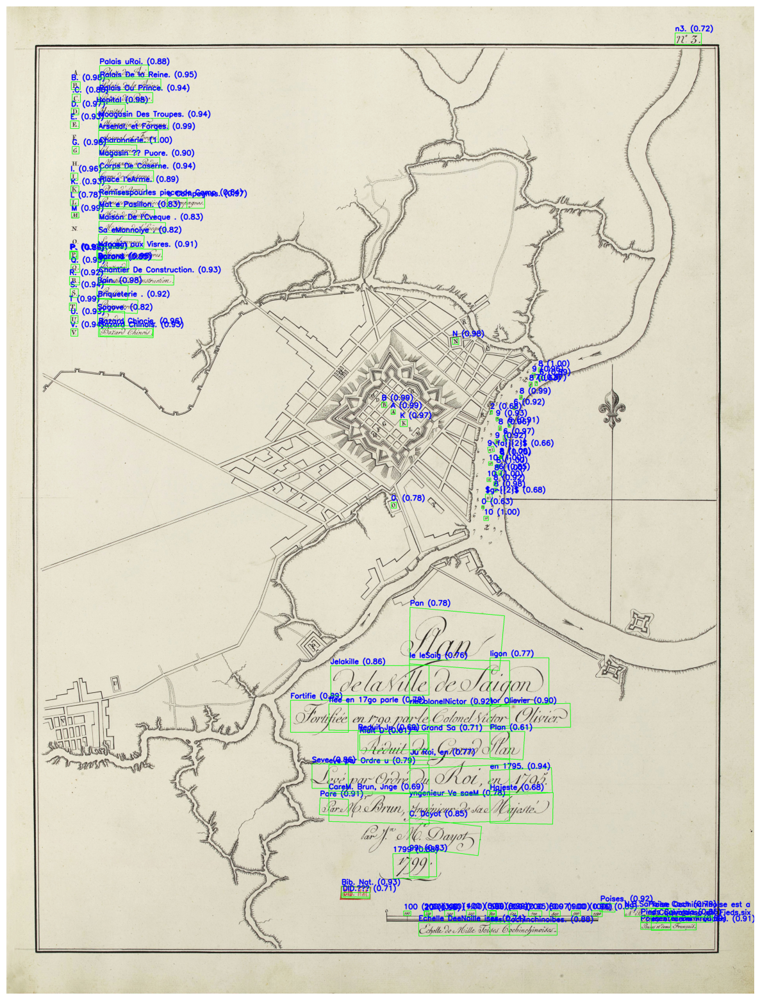

In [ ]:
import cv2
import matplotlib.pyplot as plt
import ast
import pandas as pd

# --- Load original image ---
image = cv2.imread(IMG_PATH)

# --- Load OCR CSV output ---
df = pd.read_csv("ocr_output.csv")

# Iterate through each row in CSV
for _, row in df.iterrows():
    bbox = ast.literal_eval(row["bbox"])   # convert string → list
    text = str(row["text"])
    score = float(row["score"])

    # Convert bbox list into numpy array for cv2
    pts = np.array(bbox, dtype=int).reshape((-1, 1, 2))

    # Draw polygon
    cv2.polylines(image, [pts], isClosed=True, color=(0, 255, 0), thickness=2)

    # Put text label above polygon
    x, y = pts[0][0]  # first point of bbox
    cv2.putText(image,
                f"{text} ({score:.2f})",
                (x, y - 10),
                cv2.FONT_HERSHEY_SIMPLEX,
                1.2,   # ⬆ font scale (was 0.6)
                (255, 0, 0),
                3,     # ⬆ thickness (was 2)
                cv2.LINE_AA)

# --- Convert BGR → RGB for display ---
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))
plt.imshow(image_rgb)
plt.axis("off")
plt.show()



In [ ]:
from PIL import Image

img = Image.open("/content/drive/MyDrive/1. MAP Archive /HCMC/1863.jpg")
width, height = img.size
print(f"Width: {width}px, Height: {height}px")

Width: 6527px, Height: 9000px


In [ ]:
from paddleocr import PaddleOCR
import numpy as np
from PIL import Image, ImageOps, ImageDraw, ImageFont
import json, csv, math

# -------- CONFIG --------
IMG_PATH = "/content/drive/MyDrive/1. MAP Archive /HCMC/1863.jpg"
MIN_SCORE = 0.2         # filter weak boxes
IOU_MERGE = 0.2        # dedup boxes from overlaps

ocr = PaddleOCR(
    use_doc_orientation_classify=False,
    use_doc_unwarping=False,
    use_textline_orientation=False
)

# ---- utils ----
def compute_dynamic_tiling(img_w, img_h, max_tiles=100):
    """
    Compute dynamic tile_size and overlap based on image dimensions.
    Ensures fewer than max_tiles tiles while keeping overlap safe.
    """
    # estimate tile size so that total tiles <= max_tiles
    est_tile = int(max(img_w, img_h) / math.sqrt(max_tiles))
    # keep it in a safe range
    tile_size = max(512, min(est_tile, 4000))   # clamp between 512 and 4000 px
    # overlap = 10% of tile_size, but at least 100 px
    overlap = max(100, int(tile_size * 0.1))
    return tile_size, overlap


def split_image(img, max_tiles=100):
    w, h = img.size
    tile_size, overlap = compute_dynamic_tiling(w, h, max_tiles=max_tiles)
    print(f"📐 Image {w}x{h} → tile_size={tile_size}, overlap={overlap}")

    step = tile_size - overlap
    tiles = []
    for y0 in range(0, h, step):
        for x0 in range(0, w, step):
            x1, y1 = min(x0 + tile_size, w), min(y0 + tile_size, h)
            tiles.append(((x0, y0, x1, y1), img.crop((x0, y0, x1, y1))))
    return tiles

def exif_safe_open(path):
    # Make sure the pixel buffer matches what you see in viewers
    img = Image.open(path)
    return ImageOps.exif_transpose(img).convert("RGB")

def is_normalized(poly_list):
    # Heuristic: if max coordinate <= 2.0, coords are likely normalized (0..1)
    mx = 0.0
    for p in poly_list:
        for (x, y) in p:
            mx = max(mx, float(x), float(y))
    return mx <= 2.0

def poly_to_aabb(poly):
    xs = [pt[0] for pt in poly]
    ys = [pt[1] for pt in poly]
    return [min(xs), min(ys), max(xs), max(ys)]

def iou(a, b):
    # a,b are [x0,y0,x1,y1]
    ix0 = max(a[0], b[0]); iy0 = max(a[1], b[1])
    ix1 = min(a[2], b[2]); iy1 = min(a[3], b[3])
    iw = max(0, ix1 - ix0); ih = max(0, iy1 - iy0)
    inter = iw * ih
    if inter <= 0: return 0.0
    area_a = (a[2]-a[0]) * (a[3]-a[1])
    area_b = (b[2]-b[0]) * (b[3]-b[1])
    return inter / (area_a + area_b - inter + 1e-6)

def nms_merge(objs, iou_thr=IOU_MERGE):
    # objs: list of dicts with "bbox" (poly), "score"
    # simple NMS on AABBs, keep highest score
    objs = sorted(objs, key=lambda d: d["score"], reverse=True)
    kept = []
    aabbs = []
    for o in objs:
        a = poly_to_aabb(o["bbox"])
        drop = False
        for kb, ka in zip(kept, aabbs):
            if iou(a, ka) >= iou_thr:
                drop = True
                break
        if not drop:
            kept.append(o)
            aabbs.append(a)
    return kept

def draw_overlay(base_img, results, out_path="overlay.png"):
    draw = ImageDraw.Draw(base_img, "RGBA")
    for r in results:
        poly = [(int(x), int(y)) for (x,y) in r["bbox"]]
        # polygon outline + translucent fill
        draw.polygon(poly, outline=(255,0,0,255))
        # optional label
        # draw.text(poly[0], r["text"][:20], fill=(255,0,0,255))
    base_img.save(out_path)

# ---- main OCR over tiles ----
def run_ocr_tiled(path):
    img = exif_safe_open(path)
    tiles = split_image(img)

    ocr_output = []
    W, H = img.size

    for (x0, y0, x1, y1), tile in tiles:
        tile_np = np.array(tile)  # Paddle expects numpy or str
        th, tw = tile_np.shape[0], tile_np.shape[1]

        results = ocr.predict(tile_np)  # returns list[dict] for one image

        if not results:
            continue
        r = results[0]

        polys = r.get("dt_polys", [])
        texts = r.get("rec_texts", [])
        scores = r.get("rec_scores", [])

        if len(polys) == 0:
            continue

        # If detector returns normalized coords (0..1), rescale to tile pixels
        norm = is_normalized(polys)
        for bbox, text, score in zip(polys, texts, scores):
            if score is None or float(score) < MIN_SCORE:
                continue

            # bbox is a list/array of 4 points [[x,y],...]
            pts = []
            for (px, py) in bbox:
                if norm:
                    gx = float(px) * tw + x0
                    gy = float(py) + y0
                else:
                    gx = float(px) + x0
                    gy = float(py) + y0
                pts.append([gx, gy])

            ocr_output.append({
                "bbox": pts,                # polygon in full-image coords
                "text": text,
                "score": float(score)
            })

    # Deduplicate boxes from overlaps
    ocr_output = nms_merge(ocr_output, iou_thr=IOU_MERGE)

    # Round coordinates for output stability
    for r in ocr_output:
        r["bbox"] = [[int(round(x)), int(round(y))] for (x,y) in r["bbox"]]

    # Save files
    with open("ocr_output.json", "w", encoding="utf-8") as f:
        json.dump(ocr_output, f, indent=2, ensure_ascii=False)

    with open("ocr_output.csv", "w", newline="", encoding="utf-8") as f:
        writer = csv.DictWriter(f, fieldnames=["bbox", "text", "score"])
        writer.writeheader()
        for row in ocr_output:
            writer.writerow({
                "bbox": row["bbox"],
                "text": row["text"],
                "score": row["score"]
            })

    # Visual check – draw polygons
    vis = exif_safe_open(path)
    draw_overlay(vis, ocr_output, out_path="overlay.png")

    print(f"✅ Done! {len(ocr_output)} texts. Files: ocr_output.json, ocr_output.csv, overlay.png")

run_ocr_tiled(IMG_PATH)

Creating model: ('PP-OCRv5_server_det', None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP-OCRv5_server_det`.
Creating model: ('PP-OCRv5_server_rec', None)
Model files already exist. Using cached files. To redownload, please delete the directory manually: `/root/.paddlex/official_models/PP-OCRv5_server_rec`.


📐 Image 6527x9000 → tile_size=900, overlap=100
✅ Done! 1100 texts. Files: ocr_output.json, ocr_output.csv, overlay.png


In [ ]:
!sudo apt-get install fonts-noto-cjk


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Suggested packages:
  fonts-noto-cjk-extra
The following NEW packages will be installed:
  fonts-noto-cjk
0 upgraded, 1 newly installed, 0 to remove and 35 not upgraded.
Need to get 61.2 MB of archives.
After this operation, 93.2 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 fonts-noto-cjk all 1:20220127+repack1-1 [61.2 MB]
Fetched 61.2 MB in 2s (30.8 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package fo

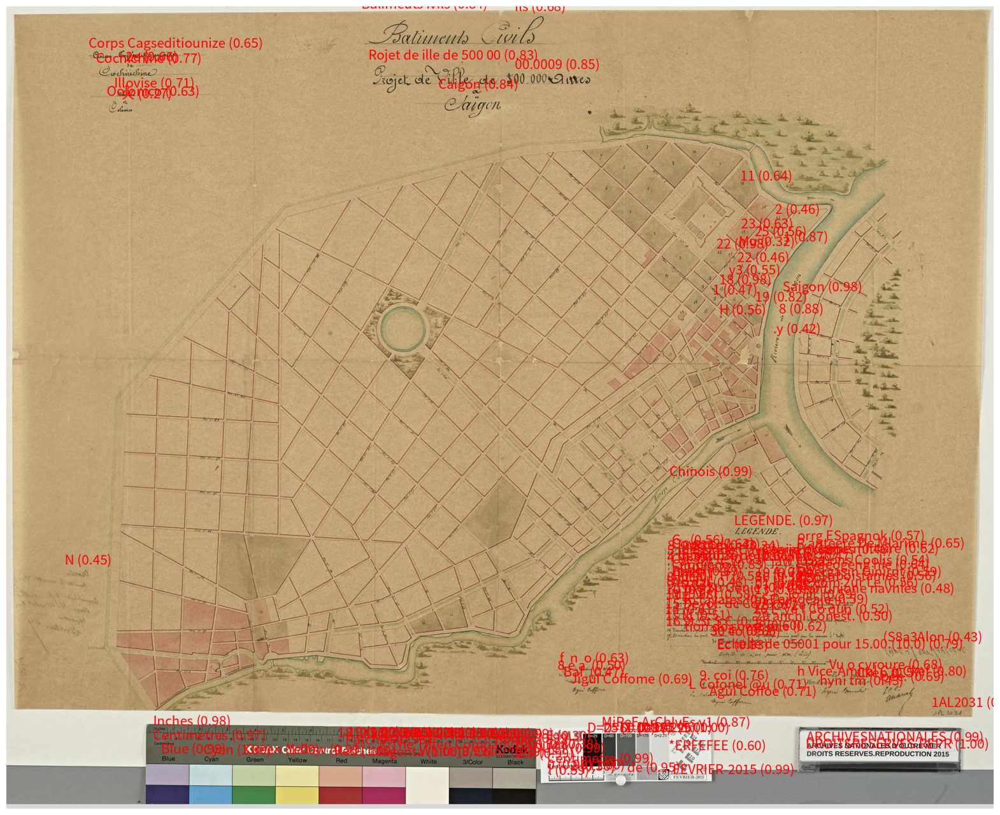

In [ ]:
import cv2
import matplotlib.pyplot as plt
import ast
import pandas as pd
import numpy as np
from PIL import Image, ImageDraw, ImageFont

# --- Load original image ---
image = cv2.imread(IMG_PATH)

# --- Load OCR CSV output ---
df = pd.read_csv("ocr_output.csv")

# Convert BGR → RGB for PIL
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
pil_img = Image.fromarray(image_rgb)
draw = ImageDraw.Draw(pil_img)

# Load a font that supports Chinese (adjust path to font file if needed)
# Example: SimHei (黑体) or NotoSansCJK
font = ImageFont.truetype("NotoSansCJK-Regular.ttc", 32)

# Iterate through each row in CSV
for _, row in df.iterrows():
    bbox = ast.literal_eval(row["bbox"])   # convert string → list
    text = str(row["text"])
    score = float(row["score"])

    # Convert bbox list into numpy array for cv2
    pts = np.array(bbox, dtype=int).reshape((-1, 1, 2))

    # Draw polygon with OpenCV (on original image)
    cv2.polylines(image_rgb, [pts], isClosed=True, color=(0, 255, 0), thickness=2)

    # Draw text with PIL (supports Chinese)
    x, y = pts[0][0]
    draw.text((x, y - 40), f"{text} ({score:.2f})", font=font, fill=(255, 0, 0))

# --- Display result ---
plt.figure(figsize=(20, 20))
plt.imshow(pil_img)
plt.axis("off")
plt.show()


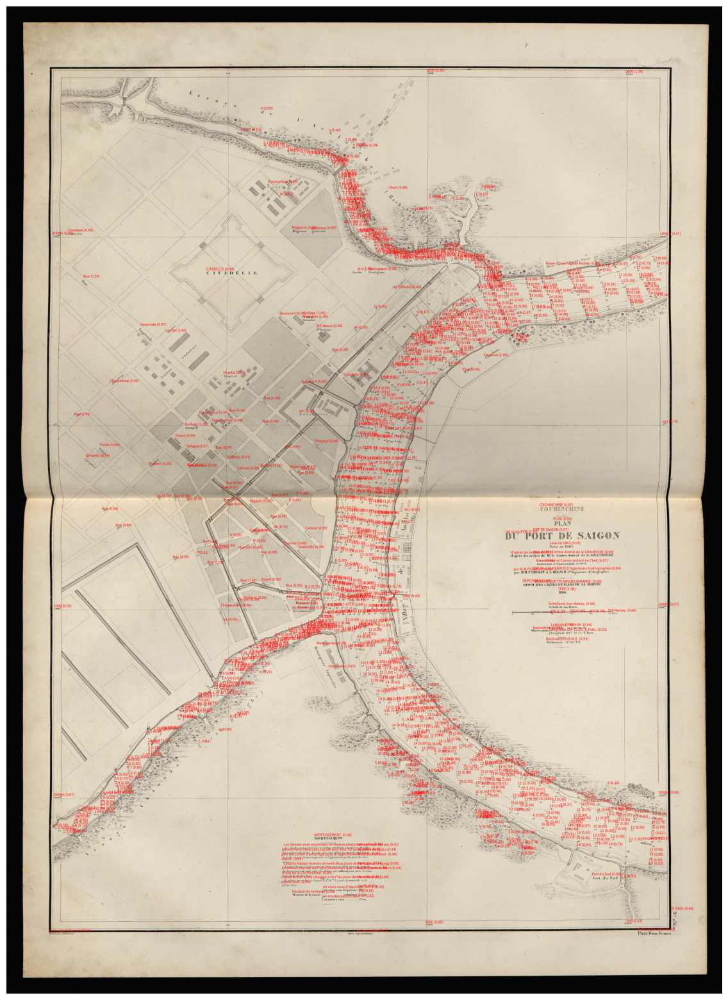

In [ ]:
import cv2
import matplotlib.pyplot as plt
import ast
import pandas as pd
import numpy as np
from PIL import Image, ImageDraw, ImageFont

# --- Load original image ---
image = cv2.imread(IMG_PATH)

# --- Load OCR CSV output ---
df = pd.read_csv("ocr_output.csv")

# Convert BGR → RGB for PIL
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
pil_img = Image.fromarray(image_rgb)
draw = ImageDraw.Draw(pil_img)

# Load a font that supports Chinese (adjust path to font file if needed)
# Example: SimHei (黑体) or NotoSansCJK
font = ImageFont.truetype("NotoSansCJK-Regular.ttc", 32)

# Iterate through each row in CSV
for _, row in df.iterrows():
    bbox = ast.literal_eval(row["bbox"])   # convert string → list
    text = str(row["text"])
    score = float(row["score"])

    # Convert bbox list into numpy array for cv2
    pts = np.array(bbox, dtype=int).reshape((-1, 1, 2))

    # Draw polygon with OpenCV (on original image)
    cv2.polylines(image_rgb, [pts], isClosed=True, color=(0, 255, 0), thickness=2)

    # Draw text with PIL (supports Chinese)
    x, y = pts[0][0]
    draw.text((x, y - 40), f"{text} ({score:.2f})", font=font, fill=(255, 0, 0))

# --- Display result ---
plt.figure(figsize=(20, 20))
plt.imshow(pil_img)
plt.axis("off")
plt.show()
